### Imports

In [11]:
# !pip install ipywidgets

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import umap
from sklearn.cluster import HDBSCAN
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import math
import os
import cv2
from tqdm import tqdm
import ipywidgets as widgets
from IPython.display import display
import joblib
%matplotlib inline

### Functions

#### Data transformation

In [13]:
def transform_mousecentric(df, main_dir, mouse):
    '''
    Transforms data into mouse-centric version.

    Parameters:
    df (pd.DataFrame): The input data.
    main_dir (str): The main directory containing transformation results.
    mouse (str): Mouse identifier.

    Returns:
    pd.DataFrame: Transformed data in mouse-centric version.
    '''
    
    folder_path = main_dir + "/Datasets/MouseCentric"
    file_path = f'/{mouse}_MouseCentric_data.csv'
    if not os.path.exists(folder_path + file_path):
    
        mc_df = df.copy()
        mc_df = mc_df.iloc[:, 1:-1]
        mc_df = mc_df.astype(float)

        s1_x = mc_df.iloc[:,39].copy()
        s1_y = mc_df.iloc[:,40].copy()

        for column_index in range(0, len(mc_df.columns), 3):
            x_column = mc_df.columns[column_index]
            y_column = mc_df.columns[column_index+1]

            x = mc_df[x_column]
            y = mc_df[y_column]

            transformed_x = x - s1_x
            transformed_y = y - s1_y

            mc_df[x_column] = transformed_x
            mc_df[y_column] = transformed_y

        mc_df.iloc[:,39]=s1_x
        mc_df.iloc[:,40]=s1_y
        mc_df.insert(0, 'frame_number', df['frame_number'])
        mc_df['mouse_no'] = float(mouse)

        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        mc_df.to_csv(folder_path + file_path, index=False)
        
    else:
        mc_df = pd.read_csv(folder_path + file_path)
        
    return mc_df
    
def transform_changecoord(df, main_dir, mouse):
    '''
    Transforms data into change coordinate version.

    Parameters:
    df (pd.DataFrame): The input data.
    main_dir (str): The main directory containing transformation results.
    mouse (str): Mouse identifier.

    Returns:
    pd.DataFrame: Transformed data in change coordinate version.
    '''
    folder_path = main_dir + "/Datasets/ChangeCoords"
    file_path = f'/{mouse}_ChangeCoords_data.csv'
    if not os.path.exists(folder_path + file_path):
    
        cc_df = df.copy()
        cc_df = cc_df.iloc[:, 1:-1]
        cc_df = cc_df.astype(float)

        for column_index in range(0, len(cc_df.columns), 3):
            x_column = cc_df.columns[column_index]
            y_column = cc_df.columns[column_index+1]

            cc_df[x_column] = cc_df[x_column] - cc_df[x_column].shift(1)
            cc_df[y_column] = cc_df[y_column] - cc_df[y_column].shift(1)

            cc_df[x_column] = cc_df[x_column].fillna(0)
            cc_df[y_column] = cc_df[y_column].fillna(0)

        cc_df.insert(0, 'frame_number', df['frame_number'])
        cc_df['mouse_no'] = float(mouse)
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        cc_df.to_csv(folder_path + file_path, index=False)
        
    else:
        cc_df = pd.read_csv(folder_path + file_path)
    return cc_df
    
def transform_mcpolar(mc_df, main_dir, mouse):
    '''
    Transforms data into mouse-centric polar coordinates version.

    Parameters:
    mc_df (pd.DataFrame): The input data in mouse-centric coordinates.
    main_dir (str): The main directory containing transformation results.
    mouse (str): Mouse identifier.

    Returns:
    pd.DataFrame: Transformed data in mouse-centric polar coordinates.
    '''
    folder_path = main_dir + "/Datasets/MouseCentricPolar"
    file_path = f'/{mouse}_MouseCentricPolar_data.csv'
    if not os.path.exists(folder_path + file_path):
    
        mcp_df = mc_df.copy()
        mcp_df = mcp_df.iloc[:,1:-1]
        mcp_df = mcp_df.astype(float)

        for col_x, col_y in zip(coordinates_columns[::2], coordinates_columns[1::2]):
            x = mcp_df[col_x]
            y = mcp_df[col_y]

            r = np.sqrt(x**2 + y**2)
            theta = np.arctan2(y, x)

            mcp_df[col_x] = r
            mcp_df[col_y] = theta

        mcp_df.insert(0, 'frame_number', df['frame_number'])
        mcp_df['mouse_no'] = float(mouse)
        
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        mcp_df.to_csv(folder_path + file_path, index=False)
    
    else:
        mcp_df = pd.read_csv(folder_path + file_path)
    
    return mcp_df
    
def transform_mcdirectional(mc_df, mcp_df, main_dir, mouse):
    '''
    Transforms data into mouse-centric directional coordinates version.

    Parameters:
    mc_df (pd.DataFrame): The input data in mouse-centric coordinates.
    mcp_df (pd.DataFrame): The data in mouse-centric polar coordinates for reference.
    main_dir (str): The main directory containing transformation results.
    mouse (str): Mouse identifier.

    Returns:
    pd.DataFrame: Transformed data in mouse-centric directional coordinates.
    '''
    folder_path = main_dir + "/Datasets/MouseDirectional"
    file_path = f'/{mouse}MouseDirectional_data.csv'
    if not os.path.exists(folder_path + file_path):
    
        md_df = mc_df.copy()
        md_df = md_df.iloc[:,1:-1]
        md_df = md_df.astype(float)

        coordinates_columns = [col for col in md_df.columns if 'x' in col or 'y' in col]

        for frame_number, frame_data_polar in mcp_df.groupby('frame_number'):

            rotation_angle = frame_data_polar.at[frame_data_polar.index[0], "('S2', 'y')"]
            affine_matrix = np.array([[np.cos(rotation_angle), -np.sin(rotation_angle)],
                                      [np.sin(rotation_angle), np.cos(rotation_angle)]])

            for col_x, col_y in zip(coordinates_columns[::2], coordinates_columns[1::2]):

                x = md_df[col_x]
                y = md_df[col_y]

                points = np.column_stack((x, y))
                transformed_points = np.dot(points[frame_number], affine_matrix)

                md_df.at[frame_number, col_x] = transformed_points[0]
                md_df.at[frame_number, col_y] = transformed_points[1]

        md_df.insert(0, 'frame_number', mc_df['frame_number'])
        md_df['mouse_no'] = float(mouse)
        
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        md_df.to_csv(folder_path + file_path, index=False)
    
    else:
        md_df = pd.read_csv(folder_path + file_path)
    
    return md_df

def transform_mcdirectionalpolar(md_df, main_dir, mouse):
    '''
    Transforms data into mouse-centric directional polar coordinates version.

    Parameters:
    md_df (pd.DataFrame): The input data in mouse-centric directional coordinates.
    main_dir (str): The main directory containing transformation results.
    mouse (str): Mouse identifier.

    Returns:
    pd.DataFrame: Transformed data in mouse-centric directional polar coordinates.
    '''
    folder_path = main_dir + "/Datasets/MouseDirectionalPolar"
    file_path = f'/{mouse}MouseDirectionalPolar_data.csv'
    if not os.path.exists(folder_path + file_path):
        
        mdp_df = md_df.copy()
        mdp_df = mdp_df.iloc[:,1:-1]
        mdp_df = mdp_df.astype(float)
        
        coordinates_columns = [col for col in md_df.columns if 'x' in col or 'y' in col]
        
        for col_x, col_y in zip(coordinates_columns[::2], coordinates_columns[1::2]):
            x = mdp_df[col_x]
            y = mdp_df[col_y]
            
            r = np.sqrt(x**2, y**2)
            theta = np.arctan2(y, x)
            
            mdp_df[col_x] = r
            mdp_df[col_y] = theta
            
        mdp_df.insert(0, 'frame_number', df['frame_number'])
        mdp_df['mouse_no'] = float(mouse)
        
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        mdp_df.to_csv(folder_path + file_path, index=False)
    
    else:
        mdp_df = pd.read_csv(folder_path + file_path)
    
    return mdp_df

def create_dataset(main_dir: str, datatype: str):
    '''
    Create data files with the given transformation type from the original data in the given main directory.

    Parameters:
    main_dir (str): The main directory containing the original data and transformation results.
    datatype (str): The type of data transformation to apply.

    Returns:
    pd.DataFrame: The dataset created based on the specified data transformation.

    Supported 'datatype' values:
    - "Original": Original data.
    - "MouseCentric": Mouse-centric data.
    - "MouseCentricPolar": Mouse-centric polar data.
    - "ChangeCoord": Data with changed coordinates.
    - "MouseDirectional": Mouse-centric directional data.
    - "MouseDirectionalPolar": Mouse-centric directional polar data.
    '''
    folder_path = main_dir + "/Datasets/Original"
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    
    dataframes = []
    
    filtered_dir = os.path.join(main_dir, 'filtered')
    files = os.listdir(filtered_dir)
    
    for file in tqdm(files, desc="Processing Files"):
        mouse=file.split("_")[1]+"."+file.split("_")[2][0:-3]
        file=os.path.join(main_dir+'/filtered/', file)
        
        new_file_path = f'/{mouse}_Original_data.csv'
        if not os.path.exists(folder_path + new_file_path):
            df = pd.read_csv(file,header=[1,2])
            df.columns = ['frame_number'] + list(df.columns[1:])
            df['mouse_no'] = float(mouse)
            df.to_csv(folder_path + new_file_path, index=False)
        else:
            df = pd.read_csv(folder_path + new_file_path)

        if datatype == "Original":
            dataframes.append(df)
        elif datatype == "MouseCentric":
            mc_df = transform_mousecentric(df, main_dir, mouse)
            dataframes.append(mc_df)
        elif datatype == "MouseCentricPolar":
            mc_df = transform_mousecentric(df, main_dir, mouse)
            mcp_df = transform_mcpolar(mc_df, main_dir, mouse)
            dataframes.append(mcp_df)
        elif datatype == "ChangeCoord":
            cc_df = transform_changecoord(df, main_dir, mouse)
            dataframes.append(cc_df)
        elif datatype == "MouseDirectional":
            mc_df = transform_mousecentric(df, main_dir, mouse)
            mcp_df = transform_mcpolar(mc_df, main_dir, mouse)
            mcd_df = transform_mcdirectional(mc_df, mcp_df, main_dir, mouse)
            dataframes.append(mcd_df)
        elif datatype == "MouseDirectionalPolar":
            mc_df = transform_mousecentric(df, main_dir, mouse)
            mcp_df = transform_mcpolar(mc_df, main_dir, mouse)
            md_df = transform_mcdirectional(mc_df, mcp_df, main_dir, mouse)
            mdp_df = transform_mcdirectionalpolar(md_df, main_dir, mouse)
            dataframes.append(mdp_df)
    
    dataset = pd.concat(dataframes, ignore_index=True)
    
    return dataset

#### Selecting subset from data

In [14]:
def generate_sub_dataset(dataset, frames_per_video=11250, mouse_number=None):
    """
    Generate a sub-dataset by selecting random videos or videos from a specific mouse
    from the given dataset.

    Args:
    dataset (pd.DataFrame): The original dataset.
    num_videos (int or None): The number of random videos to select. Set to None if specifying a mouse.
    frames_per_video (int): The number of frames per video.
    mouse_number (int or None): The mouse number to select videos for. Set to None for random selection.

    Returns:
    pd.DataFrame: A sub-dataset containing the selected videos.
    """
    if mouse_number is not None:
        # Select videos for a specific mouse
        sub_dataset = dataset[dataset['mouse_no'] == mouse_number]
        print(f'The data for mouse {mouse_number} was extracted.')
        return sub_dataset.reset_index(drop=True)
    else:
        # Generate random video indices
        selected_video_indices = np.random.choice(range(1, 99), size=1, replace=False)

    selected_videos = []

    # Create slices for each selected video
    for video_index in selected_video_indices:
        # Calculate the starting and ending frame indices for the video
        start_frame = video_index * frames_per_video
        end_frame = (video_index + 1) * frames_per_video
        # Use .loc to create a slice by row index
        video_slice = dataset.loc[start_frame:end_frame - 1]
        selected_videos.append(video_slice)

    # Concatenate the selected videos to create a sub-dataset
    sub_dataset = pd.concat(selected_videos, ignore_index=True)
    print("The following mice were randomly selected: "+ " ".join(map(str, sub_dataset['mouse_no'].unique())))
    return sub_dataset


#### UMAP and visualisation

In [15]:
def visualize_umap(data, n_neighbors=15, min_dist=0.1, n_components=2, save_dir=os.getcwd()):
    '''
    Visualize data using UMAP with adjustable hyperparameters.

    Parameters:
    data (pd.DataFrame): The data to visualize.
    n_neighbors (int): The number of neighbors for UMAP.
    min_dist (float): The minimum distance between points in UMAP.
    n_components (int): The number of UMAP dimensions to reduce to (2 or 3).
    save_dir (str): Directory to save the fitted UMAP in.

    Returns:
    None
    '''
    umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components)
    umap_result = umap_model.fit_transform(data.iloc[:, 1:-1])
    
    # Save the umap model for later use
    mouse_no = data['mouse_no'].unique().item()
    joblib.dump(umap_model, save_dir+f"umap_model_{datatype}_data_{n_components}-dimensional_mouse_nr_{str(mouse_no)}.pkl")
    
    if n_components == 2:
        # 2D plot
        plt.figure(figsize=(8, 6))
        plt.scatter(umap_result[:, 0], umap_result[:, 1], alpha=0.1)
        plt.title("UMAP 2D Visualization")
        plt.xlabel("UMAP Dimension 1")
        plt.ylabel("UMAP Dimension 2")
        plt.show()
    elif n_components == 3:
        # 3D plot
        fig = plt.figure(figsize=(14, 6))
        ax = fig.add_subplot(121, projection='3d')  # 3D plot
        ax.scatter(umap_result[:, 0], umap_result[:, 1], umap_result[:, 2], alpha=0.1)
        ax.set_title("UMAP 3D Visualization")
        ax.set_xlabel("UMAP Dimension 1")
        ax.set_ylabel("UMAP Dimension 2")
        ax.set_zlabel("UMAP Dimension 3")

        # 2D plot of first 2 dimensions
        ax2 = fig.add_subplot(122)
        ax2.scatter(umap_result[:, 0], umap_result[:, 1], alpha=0.1)
        ax2.set_title("UMAP 2D Visualization (1st and 2nd dimensions)")
        ax2.set_xlabel("UMAP Dimension 1")
        ax2.set_ylabel("UMAP Dimension 2")
        plt.show()
    
    return umap_result

#### HDBSCAN and visualisation

In [16]:
def cluster_and_visualize_umap(umap_result, data, min_samples=4, min_cluster_size=4, save_dir=os.getcwd()):
    '''
    Cluster UMAP data using HDBSCAN from scikit-learn and visualize the results.

    Parameters:
    umap_result (ndarray): The UMAP data to cluster and visualize.
    min_samples (int): The minimum number of samples in a neighborhood for HDBSCAN.
    min_cluster_size (int): The minimum number of samples in a cluster for HDBSCAN.
    save_dir (str): Directory to save the fitted HDBSCAN clusterer in.

    Returns:
    None
    '''
    # Create an HDBSCAN clusterer with optional parameters
    clusterer = HDBSCAN(min_samples=min_samples, min_cluster_size=min_cluster_size)
    
    # Save the hdbscan model for later use
    n_components = len(umap_result[0])
    mouse_no = data['mouse_no'].unique().item()
    joblib.dump(clusterer, save_dir+f"hdbscan_model_{datatype}_data_{n_components}-dimensional_mouse_nr_{str(mouse_no)}.pkl")
    
    # Fit the clusterer to the UMAP data
    cluster_labels = clusterer.fit_predict(umap_result)
    
    # Extract cluster labels
    cluster_labels = clusterer.labels_
    
    # Number of clusters found (excluding noise points)
    num_clusters = len(np.unique(cluster_labels[cluster_labels != -1]))
    
    # Display the number of clusters
    print(f"Number of clusters: {num_clusters}")
    
    if umap_result.shape[1] == 2:
        # 2D plot
        plt.figure(figsize=(8, 6))
        
        # Extract unique cluster labels (excluding noise points)
        unique_clusters = np.unique(cluster_labels[cluster_labels != -1])
        
        # Assign different colors to clusters
        colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_clusters)))
        
        for cluster_label, color in zip(unique_clusters, colors):
            cluster_indices = np.where(cluster_labels == cluster_label)
            plt.scatter(
                umap_result[cluster_indices, 0], 
                umap_result[cluster_indices, 1], 
                c=[color], 
                s=50,
                alpha=0.7
            )
        
        # Add labels and title
        plt.xlabel('UMAP Dimension 1')
        plt.ylabel('UMAP Dimension 2')
        plt.title('HDBSCAN Clustering Results in 2D')
        
        plt.grid(True)
        plt.show()
    elif umap_result.shape[1] == 3:
        # 3D plot
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(121, projection='3d')
        
        # Extract unique cluster labels (excluding noise points)
        unique_clusters = np.unique(cluster_labels[cluster_labels != -1])
        
        # Assign different colors to clusters
        colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_clusters)))
        
        for cluster_label, color in zip(unique_clusters, colors):
            cluster_indices = np.where(cluster_labels == cluster_label)
            ax.scatter(
                umap_result[cluster_indices, 0], 
                umap_result[cluster_indices, 1], 
                umap_result[cluster_indices, 2], 
                c=[color], 
                s=50,
                alpha=0.7
            )
        
        # Add labels and title
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
        ax.set_zlabel('UMAP Dimension 3')
        ax.set_title('HDBSCAN Clustering Results in 3D')
        
        ax2 = fig.add_subplot(122)
        for cluster_label, color in zip(unique_clusters, colors):
            cluster_indices = np.where(cluster_labels == cluster_label)
            ax2.scatter(umap_result[cluster_indices, 0], umap_result[cluster_indices, 1], label=f'Cluster {cluster_label}', c=[color], s=50)
        
        ax2.set_xlabel('UMAP Dimension1')
        ax2.set_ylabel('UMAP Dimension2')
        ax2.set_title('HDBSCAN Clustering Results in 2D')
        
        plt.tight_layout()
        plt.show()
        
    return clusterer

In [17]:
def plot_top_hdbscan_clusters(clusterer, umap_data, num_clusters_to_plot=5):
    '''
    Plot the top N largest clusters (excluding noise points) using HDBSCAN results.

    Parameters:
    clusterer: HDBSCAN clusterer.
    umap_data (ndarray): The UMAP data to visualize.
    num_clusters_to_plot (int): The number of largest clusters to plot.

    Returns:
    None
    '''
    cluster_labels = clusterer.labels_
    
    if umap_data.shape[1] == 2:
        # 2D plot
        plt.figure(figsize=(8, 6))
        
        # Get the cluster labels for the top N largest clusters (excluding noise points)
        unique_clusters, cluster_sizes = np.unique(cluster_labels, return_counts=True)
        cluster_info = list(zip(unique_clusters, cluster_sizes))
        sorted_clusters = sorted(cluster_info, key=lambda x: x[1], reverse=True)
        top_clusters = [label for label, size in sorted_clusters if label != -1][:num_clusters_to_plot]
        
        # Assign different colors to clusters
        colors = plt.cm.Spectral(np.linspace(0, 1, len(top_clusters)))
        
        for cluster_label, color in zip(top_clusters, colors):
            cluster_indices = np.where(cluster_labels == cluster_label)
            plt.scatter(
                umap_data[cluster_indices, 0],
                umap_data[cluster_indices, 1],
                label=f'Cluster {cluster_label}',
                c=[color],
                s=50,
                alpha=0.7
            )
        
        # Add labels and title
        plt.xlabel('UMAP Dimension 1')
        plt.ylabel('UMAP Dimension 2')
        plt.title(f'Top {num_clusters_to_plot} Largest Clusters (Excluding Noise) in 2D')
        
        plt.grid(True)
        plt.show()
    elif umap_data.shape[1] == 3:
        # 3D plot
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(121, projection='3d')
        
        # Get the cluster labels for the top N largest clusters (excluding noise points)
        unique_clusters, cluster_sizes = np.unique(cluster_labels, return_counts=True)
        cluster_info = list(zip(unique_clusters, cluster_sizes))
        sorted_clusters = sorted(cluster_info, key=lambda x: x[1], reverse=True)
        top_clusters = [label for label, size in sorted_clusters if label != -1][:num_clusters_to_plot]
        
        # Assign different colors to clusters
        colors = plt.cm.Spectral(np.linspace(0, 1, len(top_clusters)))
        
        for cluster_label, color in zip(top_clusters, colors):
            cluster_indices = np.where(cluster_labels == cluster_label)
            ax.scatter(
                umap_data[cluster_indices, 0],
                umap_data[cluster_indices, 1],
                umap_data[cluster_indices, 2],
                label=f'Cluster {cluster_label}',
                c=[color],
                s=50,
                alpha=0.7
            )
        
        # Add labels and title
        ax.set_xlabel('UMAP Dimension 1')
        ax.set_ylabel('UMAP Dimension 2')
        ax.set_zlabel('UMAP Dimension 3')
        ax.set_title(f'Top {num_clusters_to_plot} Largest Clusters (Excluding Noise) in 3D')
        
        ax2 = fig.add_subplot(122)
        for cluster_label, color in zip(top_clusters, colors):
            cluster_indices = np.where(cluster_labels == cluster_label)
            ax2.scatter(umap_data[cluster_indices, 0], umap_data[cluster_indices, 1], label=f'Cluster {cluster_label}', c=[color], s=50)
        
        ax2.set_xlabel('UMAP Dimension 1')
        ax2.set_ylabel('UMAP Dimension 2')
        ax2.set_title(f'Top {num_clusters_to_plot} Largest Clusters in 2D (Dimension 1 & 2)')
        
        plt.tight_layout()
        plt.legend()
        plt.show()
        
    return top_clusters

In [18]:
def save_frames_for_clusters(input_video_path, output_directory, largest_clusters, frame_data, datatype, n_components):
    '''
    Save frames from the input video for the specified clusters.

    Parameters:
    input_video_path (str): Path to the input video file.
    output_directory (str): Directory where frames will be saved.
    largest_clusters (list): List of cluster labels for which frames should be saved.
    frame_data (pd.DataFrame): DataFrame containing frame data including 'frame_number' and 'cluster_label'.
    datatype (str): The type of data used
    n_components (int): Indicates how many dimensions UMAP has reduced the data to

    Returns:
    None
    '''
    # Extract the mouse number from the data
    mouse_no = subset['mouse_no'].unique().item()
    
    # Set the output to a subfolder for this mouse
    mouse_dir = output_directory + f"/clustered_{datatype}_data_{n_components}-dimensional_mouse_nr_{str(mouse_no)}"
    
    # Create the output directory if it doesn't exist
    os.makedirs(mouse_dir, exist_ok=True)
    
    # Open the input video using OpenCV
    video_filename = f"/Animal_{str(mouse_no).replace('.', '_')}DLC_resnet50_Freezing_07-2020Sep29shuffle1_100000_filtered_labeled.mp4"
    video_path = input_video_path + video_filename
    
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video file.")

    # Iterate through the specified clusters
    for cluster_label in largest_clusters:
        # Create a subdirectory for each cluster
        cluster_dir = os.path.join(mouse_dir, f'cluster_{cluster_label}')
        os.makedirs(cluster_dir, exist_ok=True)

        # Filter data points for the current cluster
        cluster_data = frame_data[frame_data['cluster_label'] == cluster_label]

        # Loop through the frame numbers in the cluster and save frames
        for _, row in cluster_data.iterrows():
            frame_number = int(row['frame_number'])
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number - 1)
            ret, frame = cap.read()
            if ret:
                frame_filename = os.path.join(cluster_dir, f'frame_{frame_number}.png')
                cv2.imwrite(frame_filename, frame)

    # Release the video capture object
    cap.release()

In [60]:
def plot_timeline_for_largest_clusters(data, largest_clusters):
    '''
    Generate a timeline for the largest clusters (excluding noise) in the given data.

    Parameters:
    data (pd.DataFrame): DataFrame containing frame data, including 'frame_number' and 'cluster_label'.
    num_clusters_to_plot (int): Number of largest clusters to include in the timeline.

    Returns:
    None
    '''
    # Filter data to exclude noise cluster (-1)
    filtered_data = data[data['cluster_label'] != -1]
    
    # Extract the number of plots from the given largest clusters
    num_clusters_to_plot = len(largest_clusters)
    
    # Create a figure with subplots for each of the largest clusters
    num_rows = (num_clusters_to_plot + 1) // 2  # Calculate the number of rows for subplots
    fig, axs = plt.subplots(num_rows, 2, figsize=(12, 12))
    fig.suptitle(f'Timeline of the {num_clusters_to_plot} Largest Clusters (Excluding Noise)', fontsize=16)
    x_min = 0
    x_max = len(data)

    # Plot colored indicators for each of the largest clusters
    for idx, cluster_label in enumerate(largest_clusters):
        cluster_indices = filtered_data[filtered_data['cluster_label'] == cluster_label]
        frame_numbers = cluster_indices['frame_number'].values
        row = idx // 2
        col = idx % 2
        ax = axs[row, col]
        ax.set_title(f'Cluster {cluster_label}')
        ax.set_xlabel('Frame Number')
        ax.set_xlim(x_min, x_max)
        ax.set_yticks([])
        for frame_number in frame_numbers:
            ax.axvspan(frame_number, frame_number, alpha=0.5, color=f'C{idx}')

    # Hide empty subplots
    for idx in range(num_clusters_to_plot, num_rows * 2):
        row = idx // 2
        col = idx % 2
        axs[row, col].axis('off')

    # Adjust layout and spacing
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Display the timeline
    plt.show()
    
def plot_single_timeline_for_largest_clusters(data, largest_clusters):
    '''
    Generate a single timeline for the largest clusters (excluding noise) in the given data.

    Parameters:
    data (pd.DataFrame): DataFrame containing frame data, including 'frame_number' and 'cluster_label'.
    largest_clusters (list): List of the largest cluster labels to include in the timeline.

    Returns:
    None
    '''
    # Filter data to exclude noise cluster (-1)
    filtered_data = data[data['cluster_label'] != -1]
    
    # Create a figure for the merged timeline
    fig, ax = plt.subplots(figsize=(12, 2))
    ax.set_title(f'Timeline of the Largest Clusters (Excluding Noise)', fontsize=16)
    ax.set_xlabel('Frame Number')
    ax.set_yticks([])

    # Plot colored indicators for each of the largest clusters in the same plot
    for idx, cluster_label in enumerate(largest_clusters):
        cluster_indices = filtered_data[filtered_data['cluster_label'] == cluster_label]
        frame_numbers = cluster_indices['frame_number'].values
        for frame_number in frame_numbers:
            ax.axvspan(frame_number, frame_number, alpha=0.5, color=f'C{idx}')
    
    # Adjust layout and spacing
    plt.tight_layout()
    
    # Display the timeline
    plt.show()

## Start here
This notebook already inlcudes results results of a random mouse. \
If you want to run it for another mouse, ensure to have all necessary data in the correct places and simply follow along the notebook.

### Loading the data

Set a source directory below as `main_folder`

In [20]:
# Set the main folder to work from. This folder should have a subfolder called 'filtered' with all the unedited mouse csv files. 
# The newly transformed data will then be put in corresponding subfolders in this main folder.
main_folder = "C:/Users/Kieran/Documents/Master Thesis Data"

data_options = ["Original", "MouseCentric", "MouseCentricPolar", "ChangeCoord", "MouseDirectional", "MouseDirectionalPolar"]

dropdown = widgets.Dropdown(options=data_options, description='Select a data type:')
display(dropdown)

Dropdown(description='Select a data type:', options=('Original', 'MouseCentric', 'MouseCentricPolar', 'ChangeC…

**Make sure to run all cells above this** \
Select a datatype from the selection box above. Running the cell below will result in generating/transforming that data
and will display it underneath. \
Per type of data, all data is saved in folders separately per mouse, running the below cell will concatenate all mice data into one large dataset in the current working environment. \
Example of how a file is saved: "main_folder/Datasets/Original/2.4_Original_data.csv"

In [55]:
datatype = dropdown.value
dataset = create_dataset(main_folder, datatype)
dataset

Processing Files: 100%|████████████████████████████████████████████████████████████████| 98/98 [00:31<00:00,  3.10it/s]


,frame_number,"('nose', 'x')","('nose', 'y')","('nose', 'likelihood')","('H1R', 'x')","('H1R', 'y')","('H1R', 'likelihood')","('H2R', 'x')","('H2R', 'y')","('H2R', 'likelihood')",...,"('tail', 'x')","('tail', 'y')","('tail', 'likelihood')","('S2', 'x')","('S2', 'y')","('S2', 'likelihood')","('S1', 'x')","('S1', 'y')","('S1', 'likelihood')",mouse_no
0,0,-121.281118,6.777963,0.999969,-107.543587,-9.904076,0.999760,-91.049674,-24.262784,0.996968,...,136.551132,15.836794,0.998689,58.663218,3.552714e-15,0.994912,-428.453907,-57.731640,0.995648,11.4
1,1,-118.466293,5.164439,0.999950,-104.771778,-11.426444,0.999568,-92.801407,-25.102813,0.997916,...,139.580639,16.430253,0.999059,62.608034,3.552714e-15,0.996069,-432.897362,-57.456968,0.993003,11.4
2,2,-117.116147,3.743272,0.999945,-103.840623,-12.463020,0.999638,-91.015857,-23.573421,0.999153,...,142.442255,12.872289,0.999419,64.691238,-7.105427e-15,0.986211,-437.910362,-49.581608,0.987800,11.4
3,3,-118.168901,10.876589,0.999765,-103.922190,-6.807094,0.999534,-90.473196,-18.974423,0.999468,...,144.586701,9.035496,0.999285,66.998246,-7.105427e-15,0.981083,-443.445989,-39.517151,0.994152,11.4
4,4,-129.872247,18.977417,0.999855,-118.215160,4.053176,0.999252,-101.756529,-10.320907,0.998945,...,142.597915,6.642514,0.999156,68.408748,-7.105427e-15,0.983985,-444.126056,-45.945764,0.995609,11.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1102495,11245,-67.278284,-67.951573,0.999232,-53.510518,-67.561356,0.999924,-45.792688,-60.568728,0.999492,...,112.339967,-39.013942,0.999563,65.652483,-1.421085e-14,0.998793,44.635680,-639.773663,0.998882,88.3
1102496,11246,-63.502359,-71.564452,0.999680,-50.896190,-71.149798,0.999842,-44.362936,-61.712636,0.999562,...,112.415697,-38.871035,0.999529,65.616523,-1.065814e-14,0.998716,45.998709,-639.839548,0.998840,88.3
1102497,11247,-69.702519,-81.962860,0.999622,-55.540755,-78.942856,0.999950,-45.310777,-68.474218,0.999656,...,111.575389,-37.813775,0.999215,65.260951,-7.105427e-15,0.999035,45.910568,-640.098971,0.998980,88.3
1102498,11248,-69.750044,-81.922420,0.999570,-55.586531,-78.910630,0.999939,-45.350483,-68.447927,0.999616,...,111.369144,-37.768235,0.999225,65.197667,7.105427e-15,0.998865,45.539315,-640.125490,0.998603,88.3


#### Extracting subset from the data

Above you can see the concatenated data of all mice. \
Use the cell below to select a subset, namely the data of a single mouse, from the data. \
You can specify a specific mouse number to get only the frames from that video, or choose to extract a random
video from the data.

In [56]:
mouse_number = None # Change this to a specific mouse number to extract that data. Set to None when extracting random videos.

subset = generate_sub_dataset(dataset, mouse_number = mouse_number)
subset

The following mice were randomly selected: 32.2


,frame_number,"('nose', 'x')","('nose', 'y')","('nose', 'likelihood')","('H1R', 'x')","('H1R', 'y')","('H1R', 'likelihood')","('H2R', 'x')","('H2R', 'y')","('H2R', 'likelihood')",...,"('tail', 'x')","('tail', 'y')","('tail', 'likelihood')","('S2', 'x')","('S2', 'y')","('S2', 'likelihood')","('S1', 'x')","('S1', 'y')","('S1', 'likelihood')",mouse_no
0,0,-91.540009,43.477502,0.999921,-92.350158,26.575291,0.999822,-87.995570,8.646870,0.999894,...,149.553537,40.426735,0.999714,80.135902,0.000000e+00,0.999782,-265.324748,450.523676,0.999175,32.2
1,1,-91.612806,45.688588,0.999766,-92.694279,28.420635,0.999694,-87.049957,9.737812,0.999891,...,151.594999,37.605872,0.999231,81.071837,-2.131628e-14,0.999804,-258.532479,455.874058,0.999380,32.2
2,2,-92.664080,44.120295,0.999763,-93.876074,25.430568,0.999663,-88.633885,6.652812,0.999926,...,151.782983,39.640746,0.999110,82.392391,3.552714e-15,0.999738,-273.211255,450.613562,0.999540,32.2
3,3,-93.078017,42.469292,0.999664,-92.376733,23.250553,0.999492,-86.606784,5.271113,0.999891,...,154.288930,40.754861,0.999273,84.426161,-3.552714e-15,0.999831,-284.971077,446.531240,0.999323,32.2
4,4,-96.431320,43.630019,0.999405,-95.853272,24.381187,0.999279,-87.423442,5.728560,0.999895,...,153.838975,37.623552,0.999122,84.021482,-7.105427e-15,0.999672,-284.650354,447.206488,0.999286,32.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11245,11245,-122.893114,-35.931157,0.999702,-100.003033,-42.816647,0.999589,-76.604908,-41.126084,0.997517,...,136.751396,13.888047,0.997852,58.026767,1.665335e-15,0.998552,-297.060857,-390.312264,0.994714,32.2
11246,11246,-123.460522,-37.390250,0.999702,-100.155718,-43.169897,0.998898,-77.030348,-39.994439,0.996326,...,137.512654,12.594135,0.997456,57.381572,-2.220446e-15,0.995998,-304.139432,-385.283013,0.971379,32.2
11247,11247,-123.067031,-36.258838,0.999715,-99.770603,-42.049328,0.999332,-77.530800,-39.375647,0.995914,...,137.683521,11.224670,0.997475,57.406352,1.776357e-15,0.996204,-309.186572,-381.553581,0.956962,32.2
11248,11248,-122.514764,-36.117222,0.999734,-99.420439,-41.931225,0.999394,-75.280736,-39.364918,0.997680,...,137.878674,11.407619,0.997219,57.409460,-1.332268e-15,0.997367,-309.701269,-381.135928,0.979412,32.2


### Analysing the data

#### Dimensionality reduction with UMAP
The following function will apply UMAP dimensionality reduction on the data. \
The hyperparameters can be adjusted as desired. \
When using a 3-dimensional UMAP space, the function below will plot both a 3D plot of the results and a 2D plot of these results. Using a 2-dimensional UMAP will only plot a 2D result.

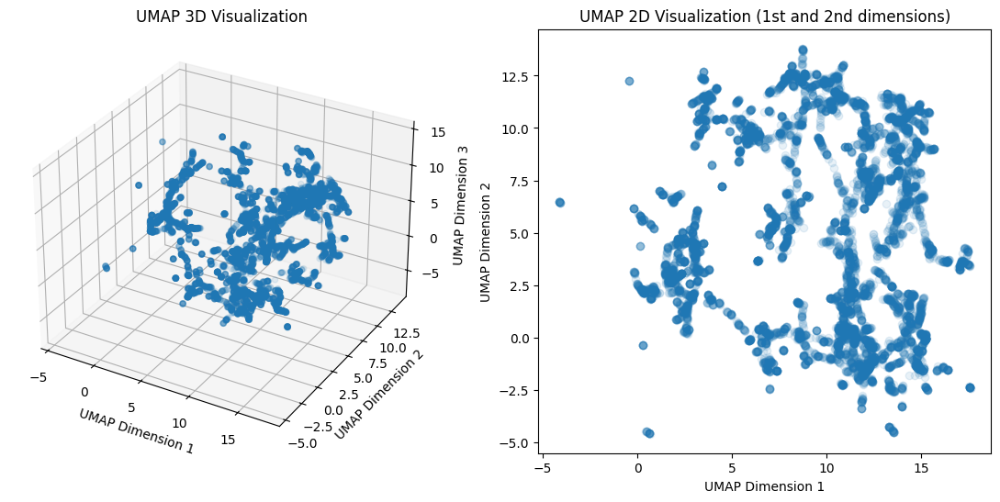

In [57]:
n_neighbors  = 15
min_dist     = 0.1
n_components = 3 # Set this to either 2 or 3 to create 2D or 3D UMAP and cluster plots

# Set a directory to save the fitted UMAP model for later use
save_dir = "C:/Users/Kieran/Documents/Master Thesis Data/Models/"

umap_result = visualize_umap(subset, n_neighbors, min_dist, n_components, save_dir)

#### Clustering with HDBSCAN
The following function will cluster the UMAP results. \
The hyperparameters can be adjusted to optimise the clustering results.

Number of clusters: 25


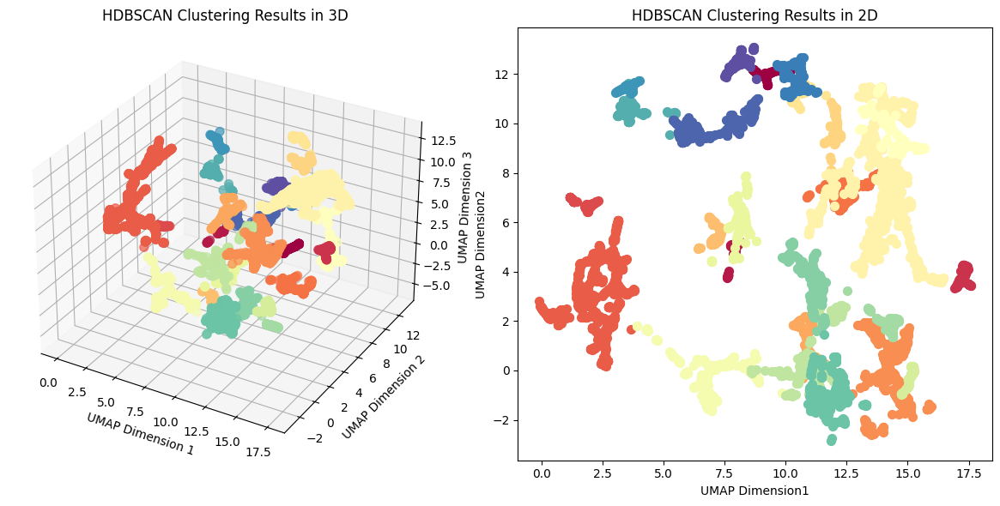

In [58]:
min_samples      = 82 # The amount of neighbors a point needs to be a 'core point'. Set higher to get less clusters but too high will cluster everything together
min_cluster_size = 82 # The minimum amount needed to form a cluster. Set this higher to get less clusters but too high will cluster everything together

# Set a directory to save the fitted UMAP model for later use
save_dir = "C:/Users/Kieran/Documents/Master Thesis Data/Models/"

clusterer = cluster_and_visualize_umap(umap_result, subset, min_samples, min_cluster_size, save_dir)

The following function will plot only the largest clusters. \
You can set the amount of largest clusters you want to plot below.

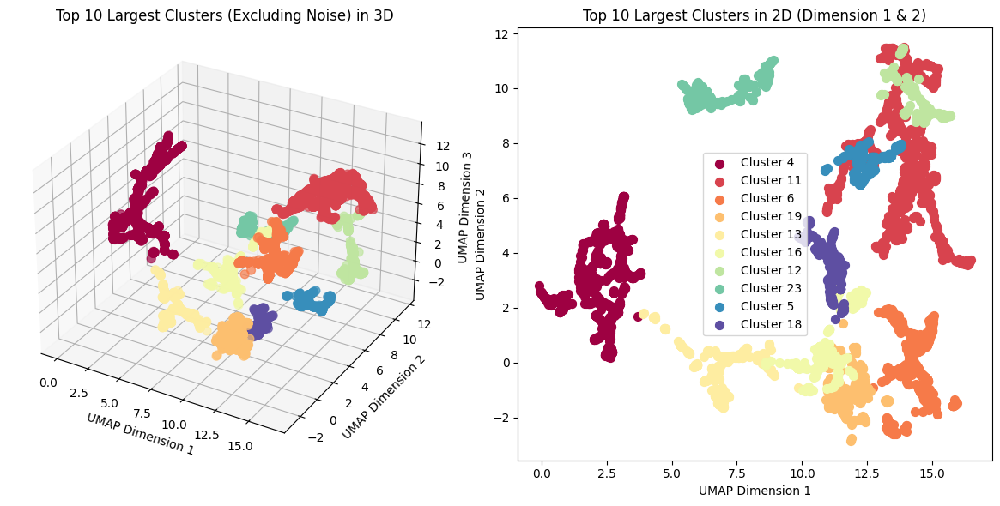

In [62]:
num_clusters_to_plot = 10 # Change this to choose how many of the largest clusters you want to show.

largest_clusters = plot_top_hdbscan_clusters(clusterer, umap_result, num_clusters_to_plot)

The following function will select the frames of each of the largest clusters from the video and save them by their cluster. \
You can set the input and output directory as desired.

In [65]:
# Add the cluster labels to our data
subset['cluster_label'] = clusterer.labels_

# Set parameters for saving frames
 # Input path, this should point to the directory containing all the mouse videos (the filtered_labeled videos).
input_video_path = "C:/Users/Kieran/Documents/Master Thesis Data/labelled_videos"
 # Output path, this is the path where you want to save the frames. Subfolders will be made for each cluster.
output_directory = "C:/Users/Kieran/Documents/Master Thesis Data/Frames"

# Saves the frames to the specified directory
save_frames_for_clusters(input_video_path, output_directory, largest_clusters, subset, datatype, n_components)

This will plot a timeline for each cluster, indicating where in the video the frames of the cluster belongs:

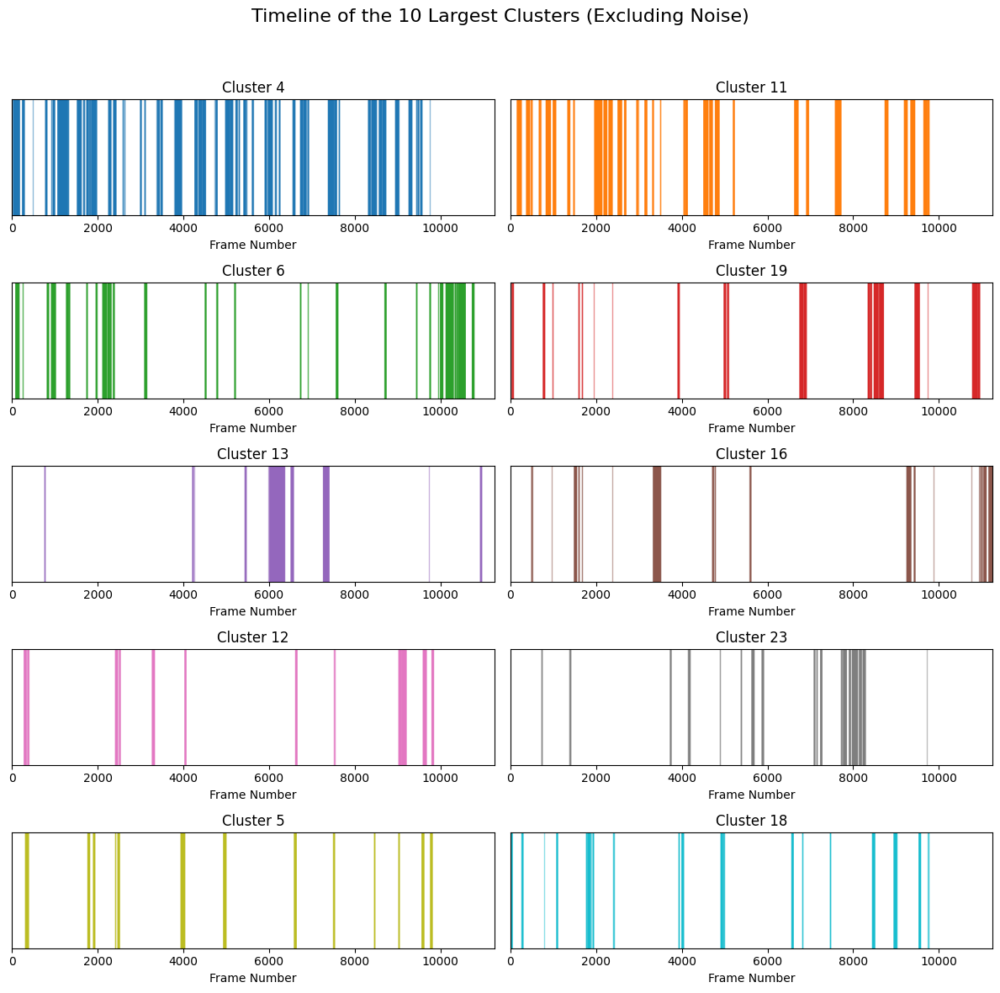

In [66]:
plot_timeline_for_largest_clusters(subset, largest_clusters)

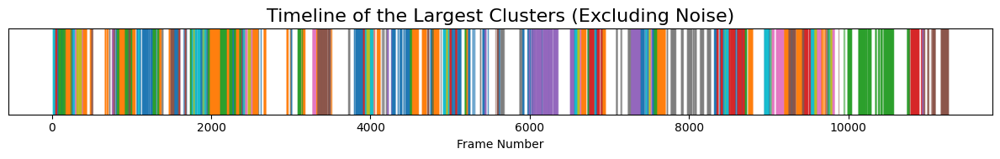

In [67]:
plot_single_timeline_for_largest_clusters(subset, largest_clusters)

The frames of each cluster are saved in corresponding folders, but to visualise them in a GIF run the code below

C:\Users\Kieran\AppData\Local\Temp\ipykernel_15116\1216696028.py:23: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img_path))


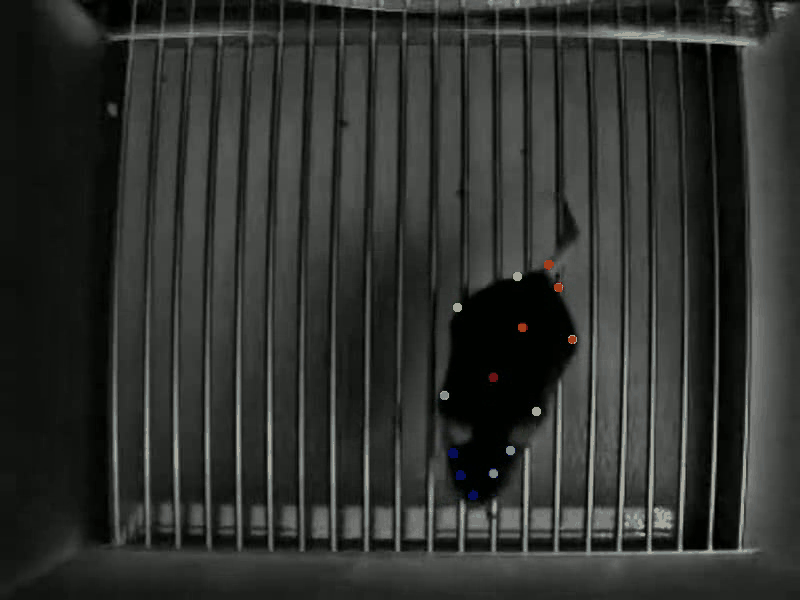

In [79]:
import imageio
import random
import os
 
# Define the directory where your images are stored
mouse_no = subset['mouse_no'].unique().item()
image_folder = main_folder + f"/Frames/clustered_{datatype}_data_{n_components}-dimensional_mouse_nr_{str(mouse_no)}/cluster_5"
 

    
# Get a list of image file names
image_files = [img for img in os.listdir(image_folder) if img.endswith(('.png', '.jpg', '.jpeg'))]
 
# Randomly select 20 images
selected_images = random.sample(image_files, 50)
 
# Create a list to hold the images
images = []
 
# Read each image file and append to the images list
for filename in selected_images:
    img_path = os.path.join(image_folder, filename)
    images.append(imageio.imread(img_path))
    
# Save the images as a GIF
gif_path = os.path.join(image_folder, 'my_animated.gif')
imageio.mimsave(gif_path, images, duration=0.2)  # duration controls the time between frames in seconds
 
# Display the GIF in Jupyter Notebook
from IPython.display import Image
Image(url=gif_path)

from IPython.display import Image, display
 
# Assuming gif_path contains the path to the saved GIF
gif_path = os.path.join(image_folder, 'my_animated.gif')
 
# Use the Image function to display the GIF
display(Image(filename=gif_path))

## Epilogue
Currently the clustering works well for single mice. \
The latent space gets a bit too crowded and uniform when using all mice. We expect this is because the latent spaces of different mice need to be matched. \
Should you wish to perform UMAP dimensionality reduction and the HDBSCAN clustering on all mice, simply skip the [Extracting subset from the data](#Extracting-subset-from-the-data) section and use the original loaded `dataset` instead of `subset` in the rest of the notebook.